# CSCA 5632 Final Project

## Project Description

This project aims to analyze and predict the function or purpose of a protein from its sequence. 

This is achieved by obtaining the Swiss-Prot protein sequence database from the [Uniprot]("https://www.uniprot.org/") website, creating embeddings of each protein sequence using the [ESM-C]("https://github.com/evolutionaryscale/esm") 300M model, and using the [Gene Ontology]("https://www.geneontology.org/") terms assigned to each protein as the label to predict.

By leveraging recent advances in protein language models, this project introduces an alternative approach to protein functional prediction that moves beyond traditional sequence alignment and structure-based methods.

## Approach

### Data Cleaning and Preprocessing
- Fetch the sequences, Gene Ontology, and Protein Family dataset from the Uniprot website
- Handle missing values and convert necessary columns to the appropriate data types.

### Feature Engineering
- Create the target feature by mapping Gene Ontology terms to their parent term, using the general GO Slim dataset
- Create the ESM-C embeddings for each sequence in the dataset

### Data Visualization
- Visualize the distribution of Gene Ontology IDs across the dataset
- Create scatterplots to visualize kmeans clusters

### Sanity check with Cosine Similarity
- Calculate the cosine similarity between a sequence embedding and the embedding matrix
- Validate that proteins with high cosine similarity by calculating the Jaccard similarity of their Pfam IDs

### Model Building
- Leverage KMeans clustering to cluster proteins by their Gene Ontology ID
- Implement TruncatedSVD to perform dimensionality reduction in combination with Kmeans
- Implement a supervised XGBoost model to compare with KMeans

### Model Evaluation
- Use cluster purity and inertia to assess KMeans model performance
- Use Explained Variance Ratio to assess TruncatedSVD model performance
- Use accuracy to assess supervised model performance


## Data
### UniprotKB dataset
Dataset citation: 
The UniProt Consortium
UniProt: the Universal Protein Knowledgebase in 2025
Nucleic Acids Res. 53:D609–D617 (2025)

The Uniprot dataset contains 572970 proteins that represent each protein in the Uniprot database that has undergone manual review. These proteins are well studied and can be used as a ground truth for predictive models.

The metadata associated with each protein is represented by the following schema:
| Column Name | Data Type |
| --- | --- |
| Sequence | String |
| Gene Ontology ID | String |
| Pfam | String|

The Gene Ontology ID field comes in as a string but it is actually a list of IDs separated by a semicolon and a space '; '. Each Gene Ontology ID (GO ID) represents a term that describes the protein's function. Since a single protein may be involved in many processes, each protein can have many GO IDs.

Ex: `GO:0003953; GO:0007165; GO:0019677; GO:0050135; GO:0061809`

Similarly, the Pfam column comes in as a string but is also a list of IDs separated by a semicolon ';'. Each Pfam ID represents a computationally predicted protein family that a protein belongs to. Again, a single protein can have many Pfam annotations.

Ex: `PF17652;PF03639`

## Data Cleaning and Feature Engineering

### Data Cleaning Steps
1. Clean the Uniprot dataset
    -  Convert the Gene Ontology IDs and Pfam IDs column to list types
    - Create a copy of the dataset that removes all rows that have a null value for the Gene Ontology ID column

### Feature Engineering Steps
1. Create a generalized GO ID column
    - Use the [GO subset mapping]("https://geneontology.org/docs/go-subset-guide/") to reduce the Gene Ontology IDs column from a list of ids to a single ID
2. Create the ESM-C embeddings for each protein
    - Use a parallelized workflow to compute the ESM-C embedding for each protein
    - Perform mean pooling on each residue to return an overall matrix of size n proteins X 960 embedding dimensions

In [179]:
# Fetch the dataset
#curl -o dataset.tsv "https://rest.uniprot.org/uniprotkb/stream?fields=id,sequence,go_id,pfam_xref&format=tsv&query=reviewed:true"
import pandas as pd
import numpy as np
np.seterr(all="ignore")

dataset = pd.read_csv("/Users/joeburke/Downloads/dataset_clean.tsv", sep="\t", dtype=str)
dataset["Gene Ontology IDs"] = dataset["Gene Ontology IDs"].str.split("; ")
dataset["Pfam"] = dataset["Pfam"].str.rstrip(";").str.split(";")
print(dataset.info())
print(dataset.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 572970 entries, 0 to 572969
Data columns (total 4 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Entry Name         572970 non-null  object
 1   Sequence           572970 non-null  object
 2   Gene Ontology IDs  552114 non-null  object
 3   Pfam               543927 non-null  object
dtypes: object(4)
memory usage: 17.5+ MB
None
    Entry Name                                           Sequence  \
0  ABTIR_ACIB9  MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...   
1   ENG1_RHIMI  MRFQVIVAAATITMITSYIPGVASQSTSDGDDLFVPVSNFDPKSIF...   
2   POLG_ZIKVF  MKNPKKKSGGFRIVNMLKRGVARVSPFGGLKRLPAGLLLGHGPIRM...   
3   GUX1_HYPJR  MYRKLAVISAFLATARAQSACTLQSETHPPLTWQKCSSGGTCTQQT...   
4  CUTI1_HYPJR  MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...   

                                   Gene Ontology IDs  \
0  [GO:0003953, GO:0007165, GO:0019677, GO:005013...   
1  [GO:0000272, GO:0005576, G

In [180]:
# Create a dictionary to map each sequence to its corresponding GO and Pfam IDs
mapping = {}
go_slim_mapping_file = pd.read_csv("/Users/joeburke/Downloads/go_mapping.tsv", dtype=str)
go_slim_mapping = go_slim_mapping_file.set_index("original_term")["go_slim_term"].to_dict()
go_ids = dataset["Gene Ontology IDs"].values
#Replace GO IDs with their corresponding GO Slim IDs
for index, item in enumerate(go_ids):
    tmp = []
    if type(item) == float and pd.isna(item):
        go_ids[index] = np.nan
        continue
    for go_id in item:
        if go_id in go_slim_mapping and go_slim_mapping[go_id] and not pd.isna(go_slim_mapping[go_id]):
            all_terms = go_slim_mapping[go_id].split(";")
            for term in all_terms:
                tmp.append(term)
    if tmp:
        # Set the overall term to the most frequent term
        overall_terms = max(set(tmp), key=tmp.count)
        go_ids[index] = overall_terms
    else:
        go_ids[index] = np.nan
dataset["Gene Ontology IDs"] = go_ids

In [181]:
# Count how many unique GO IDs are in the dataset
import itertools
unique_go_ids = set(dataset["Gene Ontology IDs"])
print(f"Number of unique GO IDs: {len(unique_go_ids)}")
# Print number of NA values for GO IDs in the dataset
print(f"Number of proteins with no GO IDs: {sum(pd.isna(dataset["Gene Ontology IDs"]))}")
print(len(dataset["Gene Ontology IDs"]))
# filter out the PFAM IDs that are null
all_pfam_ids = [x for x in dataset["Pfam"] if type(x) == list and len(x) > 0]
unique_pfam_ids = set(itertools.chain.from_iterable(all_pfam_ids))
print(f"Number of unique Pfam IDs: {len(unique_pfam_ids)}")
# Print number of proteins with no PFAM entries in the dataset
print(f"Number of proteins with no Pfam IDs: {sum(pd.isna(dataset["Pfam"]))}")

Number of unique GO IDs: 140
Number of proteins with no GO IDs: 45319
572970
Number of unique Pfam IDs: 16584
Number of proteins with no Pfam IDs: 29043


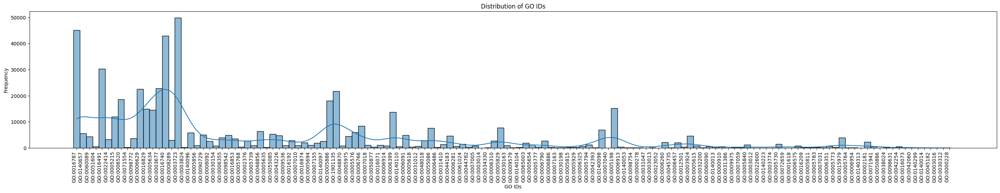

In [182]:
# Plot the distribution of GO IDs
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(35, 5))
sns.histplot(dataset["Gene Ontology IDs"], bins=30, kde=True)
plt.xticks(rotation=90, ha='right')
plt.title("Distribution of GO IDs")
plt.xlabel("GO IDs")
plt.ylabel("Frequency")
plt.show()


In [183]:
# Create the ESM-C embeddings for the sequences
# This is a very computationally intensive task and so it must be run on a machine with a GPU.
# I utilized https://vast.ai/ for this task!

# import multiprocess as mp
# import pandas as pd
# import numpy as np

# def create_embedding(protiens):
#     from esm.models.esmc import ESMC
#     from esm.sdk.api import ESMProtein, LogitsConfig
#     from tqdm import tqdm
#     client = ESMC.from_pretrained("esmc_300m").to("cuda")
#     results = []
#     for prot in tqdm(protiens, total=len(protiens)):
#         protein = ESMProtein(sequence=prot)
#         protein_tensor = client.encode(protein)
#         logits_output = client.logits(
#             protein_tensor, LogitsConfig(sequence=True, return_embeddings=True)
#         )
#         results.append(np.array(logits_output.embeddings[0].mean(axis=0).squeeze().cpu()))
#     return results
    
# def run_pipeline(sequence_arr):
#     chuncked_arrays = np.array_split(sequence_arr, 3)
#     with mp.Pool(3) as pool:
#         results = pool.map(create_embedding, chuncked_arrays)
#         res = np.concatenate( results, axis=0 )
#         np.save('protein_embeddings.npy', res)

# if __name__ == "__main__":
#    dataset = pd.read_csv("dataset.tsv", sep="\t", dtype=str)
#    dataset["Gene Ontology IDs"] = dataset["Gene Ontology IDs"].str.split("; ")
#    sequences = dataset["Sequence"].values
#    ids = dataset["Entry Name"].values
#    go_ids = dataset["Gene Ontology IDs"].values
#    mp.set_start_method('spawn', force=True)
#    run_pipeline(sequences)

In [184]:
protein_embeddings = np.load(f"/Users/joeburke/Downloads/protein_embeddings.npy")
print(protein_embeddings.shape)
print(protein_embeddings.shape)
print(f"Check for zero vectors: {np.sum(np.all(protein_embeddings == 0, axis=1))} zero vectors")

(572970, 960)
(572970, 960)
Check for zero vectors: 0 zero vectors


In [185]:
# Remove the protein embeddings that correspond to the rows with NaN in "Gene Ontology IDs"
protein_embeddings_filtered = protein_embeddings[~pd.isna(dataset["Gene Ontology IDs"].values)]
print(protein_embeddings_filtered.shape)

# Remove the rows with NaN in "Gene Ontology IDs"
dataset_filtered = dataset.dropna(subset=["Gene Ontology IDs"]).reset_index(drop=True)
print(dataset_filtered.shape)

# Check the number of unique labels that we have after filtering
num_clusters = len(set(dataset_filtered["Gene Ontology IDs"].values))
print(f"Number of clusters: {num_clusters}")

(527651, 960)
(527651, 4)
Number of clusters: 139


## EDA Summary

### Feature Descriptions
The bar chart in cell 4 shows that the distrubution of GO IDs is highly skewed, with a few GO IDs being very common and many others being rare. This is to be expected, as some GO terms are more general and apply to many proteins, while others are more specific and apply to only a few proteins.

### Feature Correlations
This dataset does not need to check for feature correlations since the main features are the proteins sequence embeddings. Embedding vectors generally don't need to be checked for correlations and I am using SVD later which will eliminate any correaltions automatically.

### Data Transformations
The Gene Ontology IDs have been transformed into more general terms, allowing for a simpler prediction task.

### Data Cleaning
I have created 2 separate datasets, 1 with the entire sequence space and the other that has any rows containing NA Gene Ontology IDs filtered out. 

I have chosen to create 2 datasets here so that the unsupervised models can be trained on the entire dataset and then predict the data that we have labels for.


## Cosine Similarity check

### Approach 
Inspired by the recommender system overview given in the lectures, I've implemented some of that logic with the sequence embeddings. 

The following code blocks are meant as a sanity check to ensure that the protein embeddings are meaningful. The check here is that given a protein embedding, the most similar protein embeddings will have a similar sequence/structure/function as the query protein.

To quantitatively check the functional similarity, I perform a Jaccard similarity calculation between the Pfam IDs of the query embedding and the top 5 most similar embeddings. 

In [186]:
from esm.models.esmc import ESMC
from esm.sdk.api import ESMProtein, LogitsConfig
def embed_sequence(sequence: str) -> np.ndarray:
    client = ESMC.from_pretrained("esmc_300m").to("mps")
    protein = ESMProtein(sequence=sequence)
    protein_tensor = client.encode(protein)
    logits_output = client.logits(
        protein_tensor, LogitsConfig(sequence=True, return_embeddings=True)
    )
    return logits_output.embeddings[0].mean(axis=0).squeeze().cpu().numpy()

def cosine_similarity(query_vec: np.ndarray, db_vecs: np.ndarray) -> np.ndarray:
    db_vecs_norm = db_vecs / (np.linalg.norm(db_vecs, axis=1, keepdims=True))
    query_norm = query_vec / (np.linalg.norm(query_vec))
    return db_vecs_norm @ query_norm

def recommend(query_seq: str, db_embeddings: np.ndarray, k=5):
    query_emb = embed_sequence(query_seq)
    scores = cosine_similarity(query_emb, db_embeddings)
    top_k = np.argsort(scores)[::-1][:k]
    return top_k, scores[top_k]

def jaccard_similarity(set1, set2):
    if not set1 or not set2:
        return 0.0
    return len(set1 & set2) / len(set1 | set2)

def evaluate_jaccard(query_id, top_ids):
    sims = [jaccard_similarity(set(dataset["Pfam"][query_id]), set(dataset["Pfam"][pid])) for pid in top_ids]
    return sum(sims) / len(sims) if sims else 0.0



In [187]:
top_k_indexes, top_k_scores = recommend(dataset["Sequence"][0],
                                        protein_embeddings, k=5)

print(dataset["Entry Name"][0])
print(top_k_indexes)
print(top_k_scores)
print(dataset["Entry Name"][top_k_indexes].values)
# Evaluate the Jaccard similarity of the top k recommendations
jaccard_score = evaluate_jaccard(0, top_k_indexes[1:])
print(f"Jaccard similarity: {jaccard_score}")

ABTIR_ACIB9
[     0 110665  76586  48011  90271]
[0.99996233 0.96767306 0.9349202  0.9299965  0.92908585]
['ABTIR_ACIB9' 'BTTIR_BACT4' 'TIRS_STAAS' 'TCPB_BRUME' 'TCPB_BRUA2']
Jaccard similarity: 1.0


## Cosine Similarity Check Summary

To evaluate the usefulness of the protein embeddings, I find the top 5 most similar proteins to the first protein in the Uniprot dataset. I then calculate the Jaccard similarity of the Pfam IDs between the query protein and the top 5 most similar proteins and get a complete match. This tells me that the embeddings are meaningful and that they will be useful in a model.

## Unsupervised Model Buidling

### Attempt 1
#### Approach
I first trained a MiniBatchKMeans model on the entire embedding dataset and predicted the clusters just for the data that there are labels for. Importantly, I also set the number of clusters for the model to predict equal to the number of unique GO IDs in the dataset. The idea here would be that each cluster would represent a GO ID and that each sequence with a given GO ID would go into that cluster.

#### Results
As a quick check, I plot the cluster centroids across 2 dimensions of the embedding data. From this check I notice that it is difficult to discern any meaningful clustering. Since this issue may arise from the high dimensionality of the protein embeddings, my 2nd attempt will use dimensionality reduction.

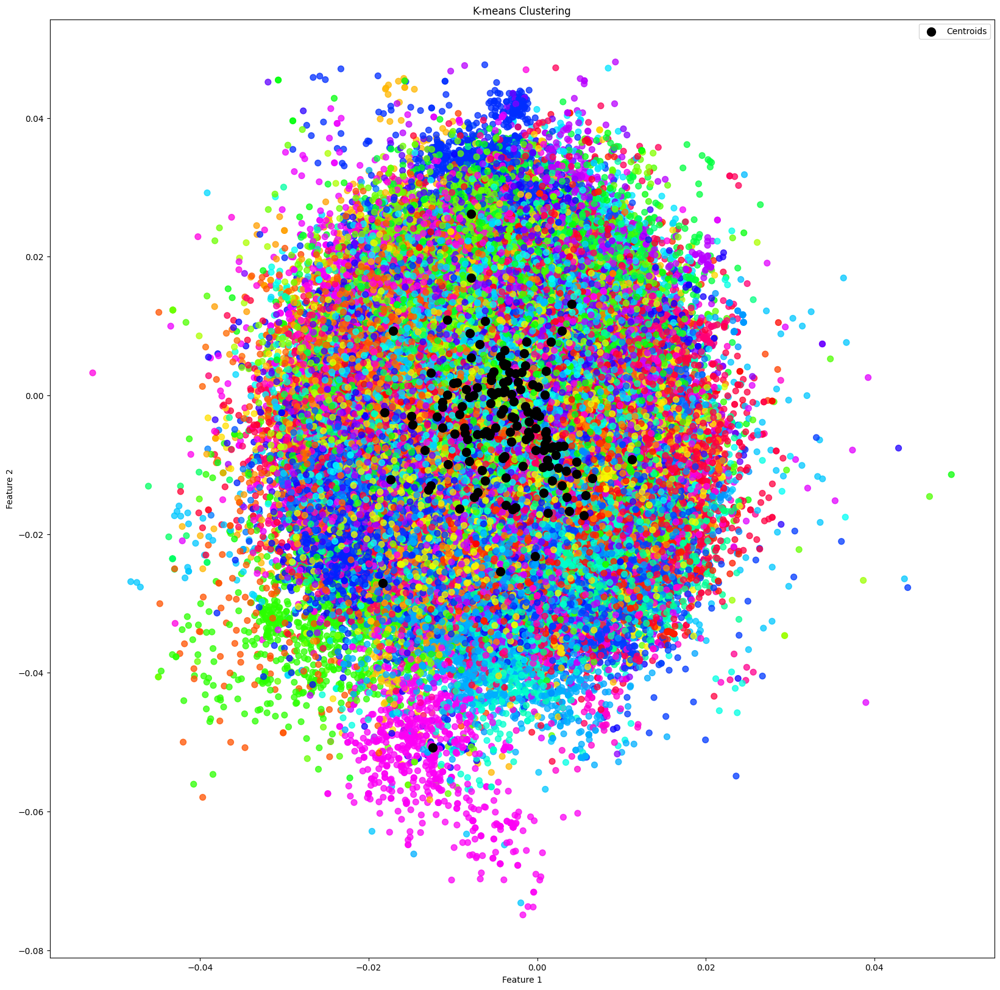

In [188]:
from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
# Train a kmeans model and plot the results
kmeans = MiniBatchKMeans(n_clusters=num_clusters, random_state=42, max_iter=100000, batch_size=1000, n_init=50)
# Fit the model on the entire dataset
kmeans.fit(protein_embeddings)
# Predict the cluster labels for the data that we have labels for
y_means = kmeans.predict(protein_embeddings_filtered)
num_colors = num_clusters
colors = [plt.cm.hsv(i/num_colors) for i in range(num_colors)]
cmap_discrete = ListedColormap(colors, name="colors")
plt.figure(figsize=(20, 20))
plt.scatter(protein_embeddings_filtered[:, 0], protein_embeddings_filtered[:, 1], c=y_means, s=50, cmap=cmap_discrete, alpha=0.75)
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=100, alpha=1, label='Centroids')
plt.title('K-means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

### Attempt 2
#### Approach
To improve the performance of the KMeans model, I explored reducing the dimensionality of the protein embeddings. I created a TruncatedSVD model with varying number of components to model the explained variance ratio. 

Through this process I determined that 75 components captures most of the variance in the embeddings and allows for faster training times in later steps.

After determining the ideal number of components to use, I train a TruncatedSVD model with 75 components, and transform the dataset that has the NA GO IDs removed. I then take the lower dimension embeddings to train another KMeans model.

#### Results
From the scatter plot we can see that training the KMeans model with the lower dimension embeddings resulted in better clustering. 

However, the results still don't align with the hypothesis that each cluster would represent a unique GO ID. This is evidenced by the bar chart showing the number of unique GO IDs per cluster (average of 70 IDs per cluster). Furthermore we can see that the cluster purity is low with an average of 0.25.

To further investigate the relevance of my hypothesis, I plot 2 dimensions of the embedding data and color each point by its GO ID. I notice here that the GO IDs are not clustered with their labels well which led me to expand the cluster space for my next attempt. 

Number of components: 10, Explained variance ratio: 0.7745852470397949
Number of components: 25, Explained variance ratio: 0.863702118396759
Number of components: 50, Explained variance ratio: 0.9150260090827942
Number of components: 100, Explained variance ratio: 0.9506402611732483
Number of components: 150, Explained variance ratio: 0.9652796387672424
Number of components: 200, Explained variance ratio: 0.9738827347755432
Number of components: 300, Explained variance ratio: 0.9840008616447449


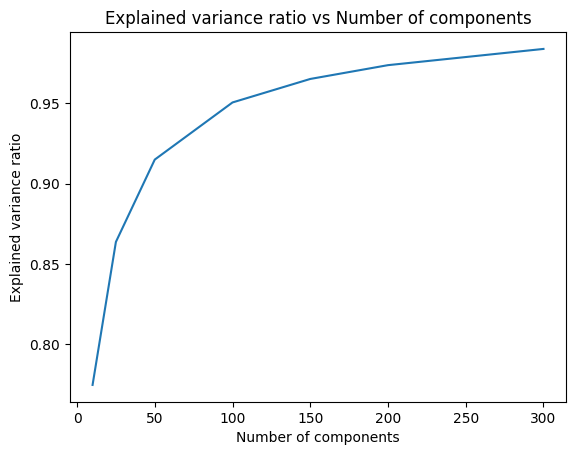

In [ ]:
from sklearn.decomposition import TruncatedSVD
components = [10, 25, 50, 100, 150, 200, 300]
# Find the best number of components by calculating the explained variance ratio
variance_ratios = []
for n in components:
    svd = TruncatedSVD(n_components=n, random_state=42)
    svd.fit(protein_embeddings)
    print(f"Number of components: {n}, Explained variance ratio: {sum(svd.explained_variance_ratio_)}")
    variance_ratios.append(sum(svd.explained_variance_ratio_))
# Plot the explained variance ratio
plt.figure(figsize=(5, 5))
plt.plot(components, variance_ratios)
plt.xlabel('Number of components')
plt.ylabel('Explained variance ratio')
plt.title('Explained variance ratio vs Number of components')
plt.show()

In [190]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=75, random_state=42)
# Fit the model on all of the data
svd.fit(protein_embeddings)
# Transform the data that we have lablels for
reduced_embeddings = svd.transform(protein_embeddings_filtered)
print(reduced_embeddings.shape)

(527651, 75)


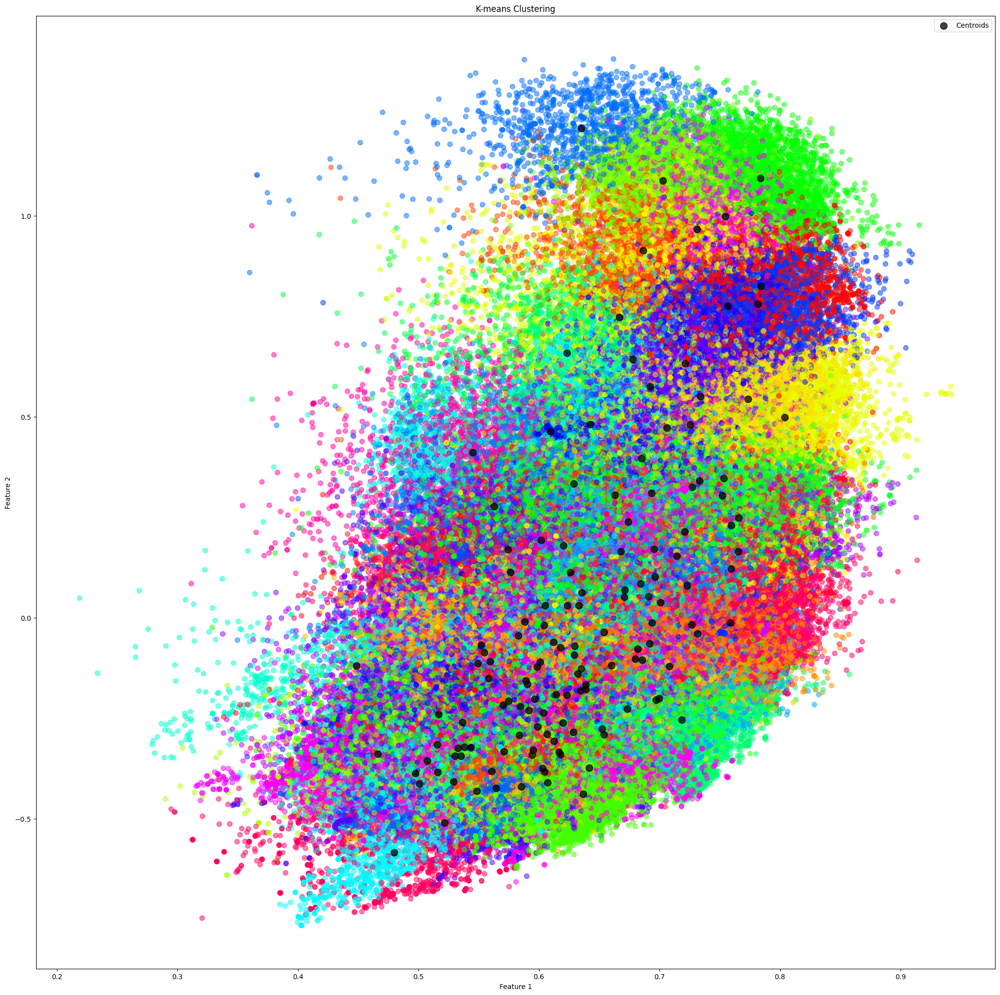

In [204]:
from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

kmeans = MiniBatchKMeans(n_clusters=num_clusters, random_state=42, max_iter=100000, batch_size=1000, n_init=50)
# Fit the model and predict the clusters
kmeans.fit(reduced_embeddings)
y_kmeans = kmeans.predict(reduced_embeddings)
num_colors = num_clusters
# Generate a list of distinct colors (example using HSV space)
colors = [plt.cm.hsv(i/num_colors) for i in range(num_colors)]
cmap_discrete = ListedColormap(colors, name="colors")
plt.figure(figsize=(25, 25))
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=y_kmeans, s=50, cmap=cmap_discrete, alpha=0.5)

# Mark cluster centers
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=100, alpha=0.75, label='Centroids')
plt.title('K-means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

In [192]:
# Inspect a cluster to see if the proteins are similar
cluster_id = 121 
cluster_indices = np.where(y_kmeans == cluster_id)[0]
print(f"Cluster {cluster_id} contains {len(cluster_indices)} proteins.")
for idx in cluster_indices[:10]:  # Display first 10 proteins in the cluster
   print(f"Protein ID: {dataset_filtered["Entry Name"][idx]}, GO IDs: {dataset_filtered["Gene Ontology IDs"][idx]}, Pfam IDs: {dataset_filtered["Pfam"][idx]}")


Cluster 121 contains 4239 proteins.
Protein ID: ZIP_BORBR, GO IDs: GO:0005886, Pfam IDs: ['PF02535']
Protein ID: RSEP_SALT1, GO IDs: GO:0016787, Pfam IDs: ['PF17820', 'PF02163']
Protein ID: YDDG_ANCN5, GO IDs: GO:0005886, Pfam IDs: ['PF00892']
Protein ID: MPC2_HUMAN, GO IDs: GO:0005215, Pfam IDs: ['PF03650']
Protein ID: LSPA_ECOLI, GO IDs: GO:0016787, Pfam IDs: ['PF01252']
Protein ID: KDPA_ECOLI, GO IDs: GO:0055085, Pfam IDs: ['PF03814']
Protein ID: BTUC_ECOLI, GO IDs: GO:0005215, Pfam IDs: ['PF01032']
Protein ID: PUTP_ECOLI, GO IDs: GO:0005215, Pfam IDs: ['PF00474']
Protein ID: MRAY_ECOLI, GO IDs: GO:0016740, Pfam IDs: ['PF00953', 'PF10555']
Protein ID: YCIB_ECOLI, GO IDs: GO:0005886, Pfam IDs: ['PF04279']


In [193]:
# Calculate the number of unique GO IDs and Pfam IDs every cluster
from collections import defaultdict
def count_unique_ids(y_kmeans, df):
    cluster_go_counts = defaultdict(set)
    for idx in range(len(y_kmeans)):
        cluster_id = y_kmeans[idx]
        if not pd.isna(df.loc[idx, "Gene Ontology IDs"]):
            if cluster_id in cluster_go_counts:
                st = cluster_go_counts[cluster_id]
                st.add(df.loc[idx, "Gene Ontology IDs"])
                cluster_go_counts[cluster_id] = st
            else :
                cluster_go_counts[cluster_id] = set(df.loc[idx, "Gene Ontology IDs"])
    return cluster_go_counts

cluster_go_counts = count_unique_ids(y_kmeans, dataset_filtered)

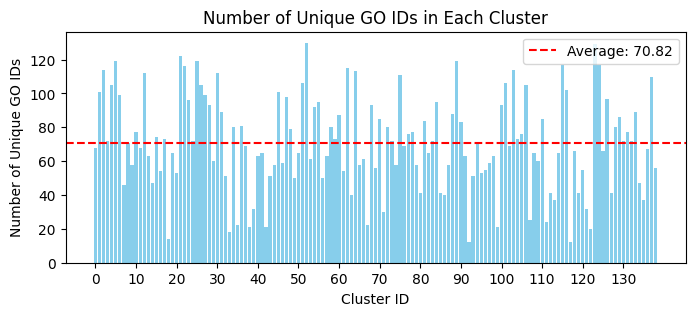

In [194]:
# Create a chart to visualize the number of unique GO IDs in each cluster
import matplotlib.pyplot as plt
cluster_go_counts_list = []
for cluster_id in range(num_clusters):
    num_go_ids = len(cluster_go_counts[cluster_id])
    cluster_go_counts_list.append(num_go_ids)
plt.figure(figsize=(8, 3))
plt.bar(range(num_clusters), cluster_go_counts_list, color='skyblue')
plt.xlabel('Cluster ID')
plt.ylabel('Number of Unique GO IDs')
plt.title('Number of Unique GO IDs in Each Cluster')
plt.xticks(range(0, num_clusters, 10))
# Add a horizontal line at the average number of unique GO IDs
average_go_ids = np.mean(cluster_go_counts_list)
plt.axhline(y=average_go_ids, color='r', linestyle='--', label=f'Average: {average_go_ids:.2f}')
plt.legend()
plt.show()


In [195]:
# Calculate the cluster purity
def calculate_cluster_purity(y_kmeans, df):
    cluster_purity = {}
    for cluster_id in range(len(set(y_kmeans))):
        cluster_indices = np.where(y_kmeans == cluster_id)[0]
        if len(cluster_indices) == 0:
            continue
        go_ids_in_cluster = df.loc[cluster_indices, "Gene Ontology IDs"].values
        go_id_counts = defaultdict(int)
        
        for go_ids in go_ids_in_cluster:
            go_id_counts[go_ids] += 1
        
        if not go_id_counts:
            continue
        
        # Find the most common GO ID in the cluster
        most_common_go_id_count = max(go_id_counts.values())
        purity = most_common_go_id_count / len(cluster_indices)
        cluster_purity[cluster_id] = purity
    
    return cluster_purity


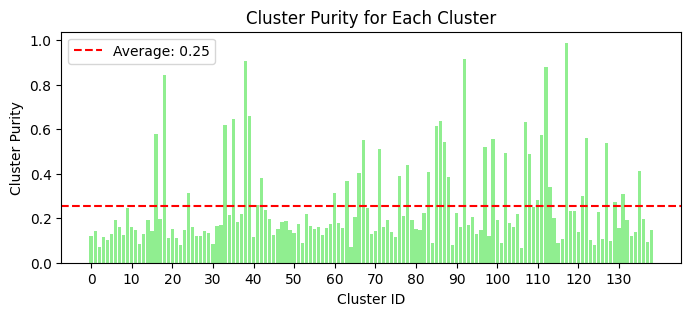

In [196]:
cluster_purity = calculate_cluster_purity(y_kmeans, dataset_filtered)
# Create a chart to visualize the cluster purity
cluster_purity_list = []
for cluster_id in range(num_clusters):
    cluster_purity_list.append(cluster_purity.get(cluster_id, 0))
plt.figure(figsize=(8, 3))
plt.bar(range(num_clusters), cluster_purity_list, color='lightgreen')
plt.xlabel('Cluster ID')
plt.ylabel('Cluster Purity')
plt.title('Cluster Purity for Each Cluster')
plt.xticks(range(0, num_clusters, 10))
# Add a horizontal line at the average cluster purity
average_purity = np.mean(cluster_purity_list)
plt.axhline(y=average_purity, color='r', linestyle='--', label=f'Average: {average_purity:.2f}')
plt.legend()
plt.show()

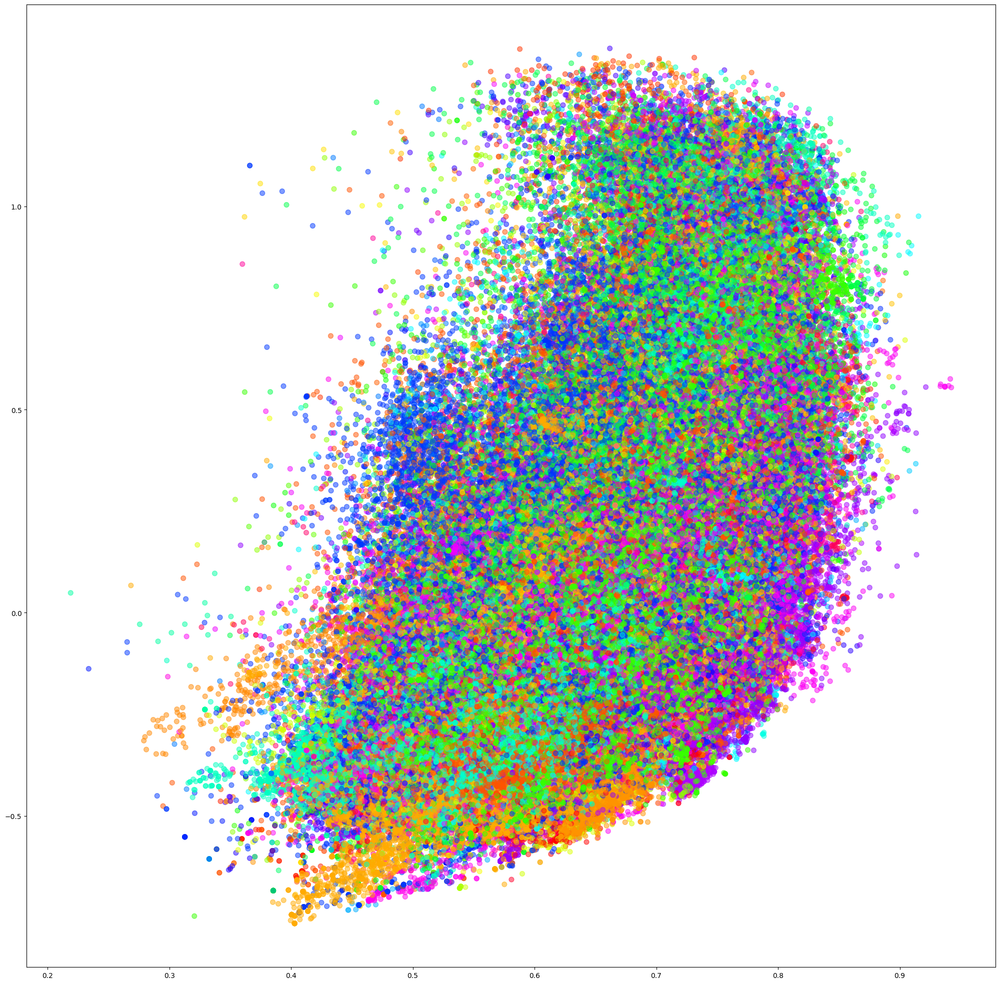

In [ ]:
# Create a scatter plot just based on the GO IDs
import matplotlib.pyplot as plt
unique_go_ids = set(dataset_filtered["Gene Ontology IDs"].values)
go_colors = {go_id: i for i, go_id in enumerate(unique_go_ids)}
colors = [plt.cm.hsv(i/num_colors) for i in range(len(unique_go_ids))]
cmap_discrete = ListedColormap(colors, name="colors")
plt.figure(figsize=(25, 25))
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], 
            c=[go_colors[go_id] for go_id in dataset_filtered["Gene Ontology IDs"].values if go_id in go_colors],
            cmap=cmap_discrete,
            s=50, alpha=0.5)
plt.show()

## Attempt 3
### Approach
To determine the optimal number of clusters for the KMeans algorithm, I use the elbow method to train multiple models across a clustering space. For each model I note the intertia to assess the quality of the clustering. I then plot the number of clusters against the inertia values to quantitatively determine the optimal number of clusters to train the model with. This process determined that 2000 clusters was most optimal. 

With this, I trained another KMeans model with 2000 clusters on the SVD reduced protein embeddings.

### Results
The scatter plot shows separated clusters but it is hard to visually determine the performance. 

However we can quantitatively see that the number of unique GO IDs per cluster has decreased to an average of 27. Likewise the cluster purity has increased to an average of 0.46.

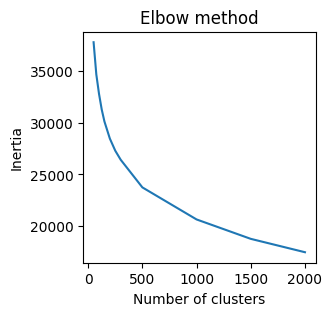

In [ ]:
# Use elbow method to find the optimal number of clusters
inertia = []
clusters = [ 50, 75, 100, 125, 150, 200, 250, 300, 500, 1000, 1500, 2000]
for n in clusters:
    kmeans = MiniBatchKMeans(n_clusters=n, random_state=42, max_iter=100000, batch_size=1000, n_init=50)
    kmeans.fit(reduced_embeddings)
    inertia.append(kmeans.inertia_)
plt.figure(figsize=(3, 3))
plt.plot(clusters, inertia)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow method')
plt.show()


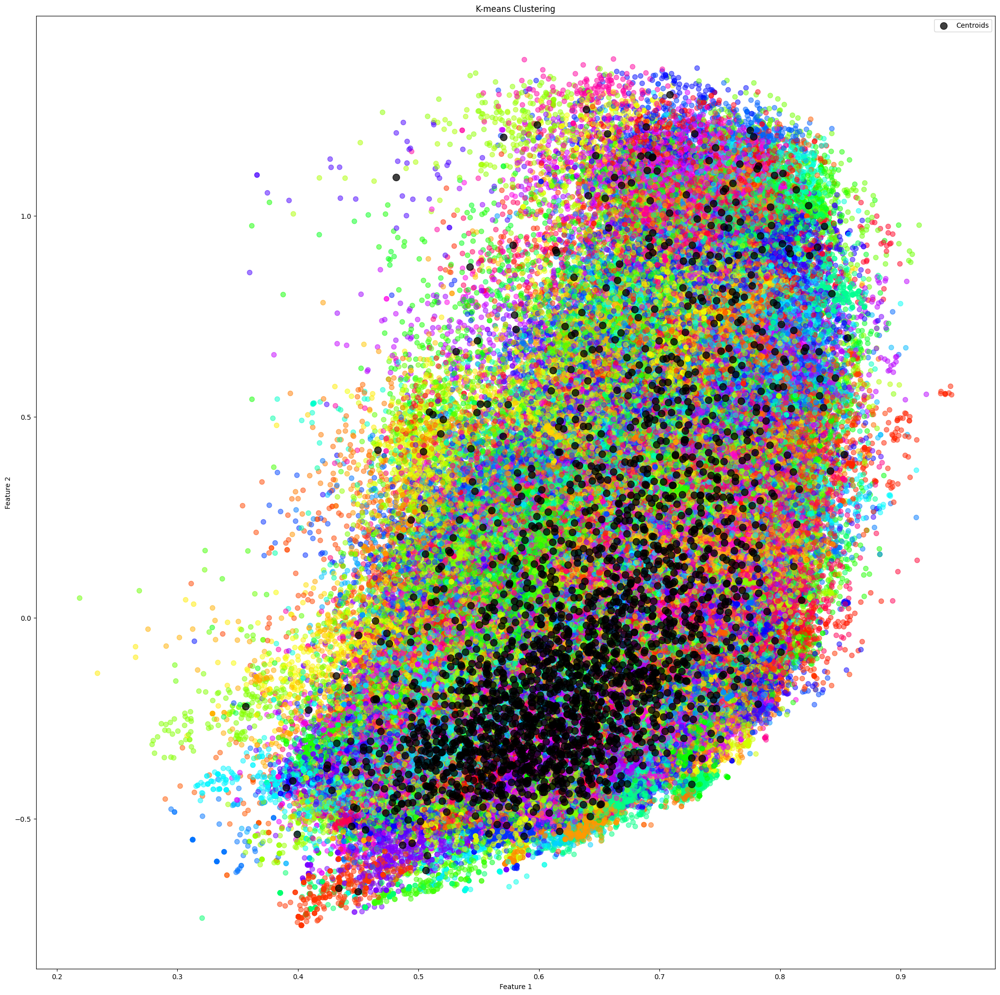

In [203]:
from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

kmeans = MiniBatchKMeans(n_clusters=2000, random_state=42, max_iter=100000, batch_size=1000, n_init=50)
# Fit the model and predict the clusters
kmeans.fit(reduced_embeddings)
y_kmeans = kmeans.predict(reduced_embeddings)
num_colors = 2000
# Generate a list of distinct colors (example using HSV space)
colors = [plt.cm.hsv(i/num_colors) for i in range(num_colors)]
cmap_discrete = ListedColormap(colors, name="colors")
plt.figure(figsize=(25, 25))
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=y_kmeans, s=50, cmap=cmap_discrete, alpha=0.5)

# Mark cluster centers
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=100, alpha=0.75, label='Centroids')
plt.title('K-means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

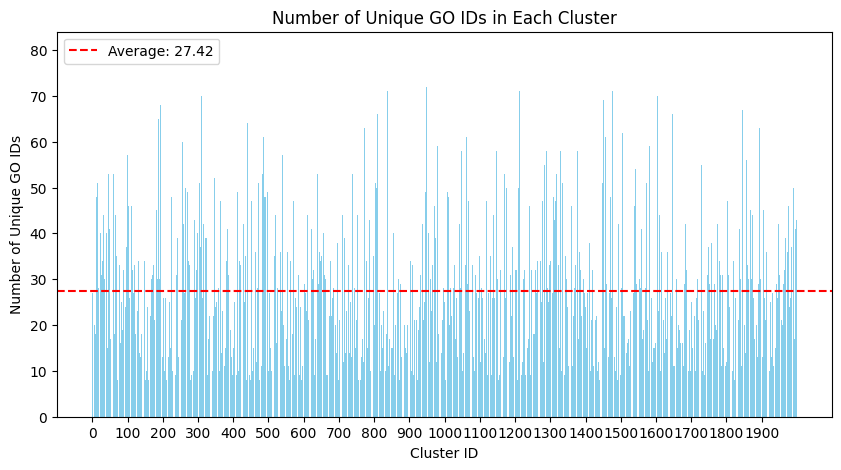

In [200]:
cluster_go_counts = count_unique_ids(y_kmeans, dataset_filtered)
cluster_go_counts_list = []
for cluster_id in range(2000):
    num_go_ids = len(cluster_go_counts[cluster_id])
    cluster_go_counts_list.append(num_go_ids)
plt.figure(figsize=(10, 5))
plt.bar(range(2000), cluster_go_counts_list, color='skyblue')
plt.xlabel('Cluster ID')
plt.ylabel('Number of Unique GO IDs')
plt.title('Number of Unique GO IDs in Each Cluster')
plt.xticks(range(0, 2000, 100))
# Add a horizontal line at the average number of unique GO IDs
average_go_ids = np.mean(cluster_go_counts_list)
plt.axhline(y=average_go_ids, color='r', linestyle='--', label=f'Average: {average_go_ids:.2f}')
plt.legend()
plt.show()

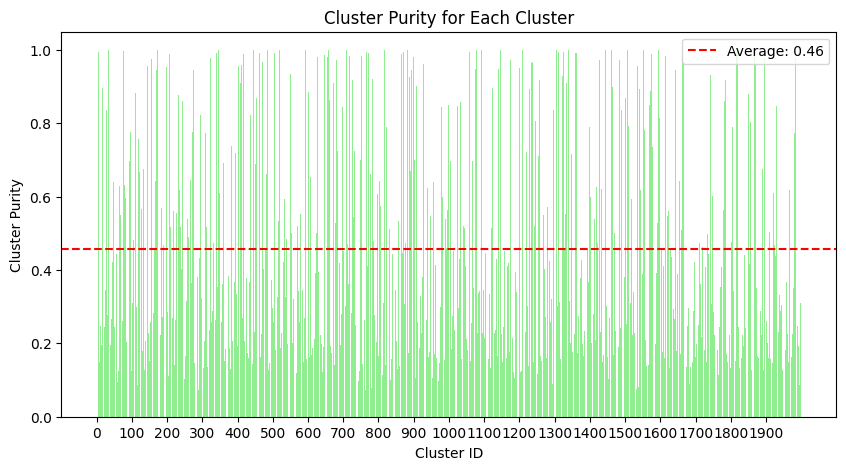

In [201]:
cluster_purity = calculate_cluster_purity(y_kmeans, dataset_filtered)
# Create a chart to visualize the cluster purity
import matplotlib.pyplot as plt
cluster_purity_list = []
for cluster_id in range(2000):
    cluster_purity_list.append(cluster_purity[cluster_id])
plt.figure(figsize=(10, 5))
plt.bar(range(2000), cluster_purity_list, color='lightgreen')
plt.xlabel('Cluster ID')
plt.ylabel('Cluster Purity')
plt.title('Cluster Purity for Each Cluster')
plt.xticks(range(0, 2000, 100))
# Add a horizontal line at the average cluster purity
average_purity = np.mean(cluster_purity_list)
plt.axhline(y=average_purity, color='r', linestyle='--', label=f'Average: {average_purity:.2f}')
plt.legend()
plt.show()

## Discussion and Conclusion
### Learnings and Takeaways

The goal of this project was to predict the function of a protein by using the embeddings from a state of the art protein language model. This was achieved by designing a process to create embeddings for the protein sequences and designing multiple unsupervised/supervised machine learning models.

Through this project I have learned about how protein sequence embeddings can be a useful representation to compare and predict functions without relying on traditional representations like sequence alignment and structural modeling. I feel like I have just started to scratch the surface of what you can do with these models!

I have also learned the power of dimensionality reduction. Through applying SVD here and PCA in class, I can see that reducing the noise can lead to more accurate predictions. The unsupervised model that I trained on the reduced embeddings was able to cluster much better than the model with the raw data.

### Limitations
One of the main limitations for this project was the scale of the data. I wanted to choose a dataset that would be biologically relevant for a project like this but this dataset proved difficult to manipulate with limited resources. 

Also, this dataset is very complex with protein sequences across all functions and all domains of life. This complexity could have limited the performance of my models since they were trying to predict very general functional terms.

Finally, the GO IDs themselves may not be the best labels to predict since it is likely that a single protein may have multiple GO IDs. This project simplifies this issue by assigning a single single GO ID per protein but this simplification could negatively impact model performance.

### Next steps
To build off of this project, I would propose the following next steps:

- Try subsetting the data by species or protein function and use that subset for model training/prediction
- Test out other unsupervised learning models like Hierarchical clustering
- Perform a grid search technique for further optimizing the paramters of the KMeans model

## Conclusion
The results of this project indicate that the protein embedding data might be too complex to predict generalized GO IDs with an unsupervised KMeans model. Another conclusion could be that generalizing the GO IDs that are assigned to a protein may be an over simplification that results in poor accuraccy scores.

These conclusions are evidenced by the best KMeans model having an average of 27 unique GO IDs per cluster and an average cluster purity of 0.46. Additionally, the best supervised model gave an accuraccy on the test dataset of 0.78. 

Overall the supervised and unsupervised models did not provide high quality results for the prediction task, but this project could serve as a template for further work with more detailed prediction tasks.